# Анализ рынка заведений общественного питания Москвы

Проект направлен на анализ рынка общественного питания в Москве, чтобы помочь инвесторам из фонда "Shut Up and Take My Money" определить наиболее перспективный формат и расположение будущего заведения. В рамках исследования будет проведен глубокий анализ существующих кафе, ресторанов, баров, пиццерий и других типов заведений по различным критериям, включая распределение по районам, сетевость, популярность брендов, а также специализация на кофейнях, поскольку заказчики заинтересованы в открытии аналогичного "Central Perk" заведения из сериала "Друзья".


**Цель проекта:** подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


**Задачи проекта:**

1) Изучить общую информацию о датасете;

2) Выполнить предобработку данных;

3) Проанализировать рынок общетсвенного питания Москвы;

4) Провести детализированное исследование для открытие кофейни;

5) Подготовить презентацию.


Для достижения поставленных целей будут использованы актуальные данные по заведениям Москвы, предоставленные сервисами Яндекс Карты и Яндекс Бизнес. На основании полученных результатов будет подготовлена презентация, в которой будут отражены ключевые выводы и рекомендации для инвесторов по выбору наиболее выгодной стратегии.

Описание данных

Файл moscow_places.csv:

* name — название заведения;

* address — адрес заведения;

* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

* hours — информация о днях и часах работы;

* lat — широта географической точки, в которой находится заведение;

* lng — долгота географической точки, в которой находится заведение;

* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    
    * «Средний счёт: 1000–1500 ₽»;
    
    * «Цена чашки капучино: 130–220 ₽»;
    
    * «Цена бокала пива: 400–600 ₽».

* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    
    * 0 — заведение не является сетевым
    
    * 1 — заведение является сетевым

* district — административный район, в котором находится заведение, например Центральный административный округ;

* seats — количество посадочных мест.

# Оглавление

1. [Ознакомление с данными](#start)


2. [Предобработка данных](#preprocessing)
    * [Дубликаты](#dub)
    * [Пропуски](#null)
    * [Создание столбцов](#create_column)
    
    
3. [Анализ данных](#da)
    * [Категории заведений](#category)
    * [Посадочные места](#seats)
    * [Сетевые и несетевые заведения](#chain)
    * [Топ-15 популярных сетей в Москве](#top-15)
    * [Административные районы Москвы](#district)
    * [Средние рейтинги по категориям](#average_rating)
    * [Фоновая картограмма со средним рейтингом по районам](#average_rating_district)
    * [Все заведения датасета на карте](#map_place)
    * [Топ-15 улиц по количеству заведений](#top-15-stree)
    * [Исслеедование улиц с одним объектом](#one-place)
    * [Средние чеки](#average_bill)
    * [Дополнительное исследование](#dop_da)
    
    
4. [Детализируем исследование: открытие кофейни](#open-cofee)
    * [Кофейные районы](#cofee-district)
    * [Круглосуточные кофейни](#cofee-24)
    * [Рейтинги кофеен](#cofee-rating)
    * [Средняя цена чашки капучино](#average-cofee)
    
    
5. [Итоговый вывод](#conclusion)


6. [Презентация](#presentation)


<a id="introduction"></a>

## Ознакомление с данными 

In [1]:
!pip install folium

In [2]:
# Загрузим нужные библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from plotly import graph_objects as go
import plotly.express as px
import json
import folium
from folium import Map, Choropleth, Marker, GeoJsonTooltip
from folium.plugins import MarkerCluster

In [3]:
data = pd.read_csv("C:\\Users\\User\\OneDrive\\Desktop\\da_practicum\\CSV\\project_10\\moscow_places.csv")

In [4]:
# Создадим функцю для отображения первичной информации об исходных данных
def data_first_view(data):
    # Вывод первых 10 строк
    print('*' * 50)
    print("Первые 10 строк данных:")
    display(data.head(10))
    
    # Информация о данных
    print('*' * 50)
    print("\nИнформация о данных:")
    display(data.info())
    
    # Имена столбцов
    print('*' * 50)
    print("\nИмена столбцов:")
    display(data.columns)
    
    # Описательная статистика
    print('*' * 50)
    print("\nОписательная статистика:")
    display(data.describe())
    
    # Количество пропущенных значений
    print('*' * 50)
    print("\nКоличество пропущенных значений в каждом столбце:")
    display(data.isna().sum())
    
    # Количество дубликатов
    print('*' * 50)
    print("\nКоличество дубликатов:")
    display(data.duplicated().sum())

In [5]:
data_first_view(data)

**************************************************
Первые 10 строк данных:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


**************************************************

Информация о данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage

None

**************************************************

Имена столбцов:


Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

**************************************************

Описательная статистика:


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**************************************************

Количество пропущенных значений в каждом столбце:


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

**************************************************

Количество дубликатов:


0

<a id="preprocessing"></a>

## Предобработка данных

<a id="dub"></a>

### Дубликаты

На предыдущем шаге мы увидели, что явных дубликатов у нас нет. Стоит рассмотреть наличие неявных дубликатов.

In [6]:
columns = ['category', 'district']
for column in columns:
    unique_values = pd.DataFrame(data[column].unique())
    print(f'Уникальные значения в столбце {column}:')
    display(unique_values)
    print('\n')

Уникальные значения в столбце category:


,0
0,кафе
1,ресторан
2,кофейня
3,пиццерия
4,"бар,паб"
5,быстрое питание
6,булочная
7,столовая




Уникальные значения в столбце district:


,0
0,Северный административный округ
1,Северо-Восточный административный округ
2,Северо-Западный административный округ
3,Западный административный округ
4,Центральный административный округ
5,Восточный административный округ
6,Юго-Восточный административный округ
7,Южный административный округ
8,Юго-Западный административный округ


Также рассмотрим наличие строк, у которых совпадает название, адрес и округ. Но для начала переведем значения столбцов в нижний регистр.

In [7]:
lower_columns = ['name', 'address', 'district']

# Временно создаем копию DataFrame с приведением к нижнему регистру
temp_data = data.copy()
for column in lower_columns:
    temp_data[column] = data[column].str.lower()

In [8]:
temp_data.duplicated(subset=['name', 'address', 'district']).sum()

4

In [9]:
temp_data[temp_data.duplicated(subset=['name', 'address', 'district'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",северо-восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",северо-восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Видим, что в нашем случае присутствует заведения, у которых совпадает название, адрес и округ. В данном случае мы можем удалить дубликаты.

In [10]:
# Удаляем дубликаты в исходном датафрейме на основе временных данных
data = data[~temp_data.duplicated(subset=lower_columns, keep='first')]

<a id="null"></a>

### Пропуски

У нас присутствуют пропуски в 6 столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Рассмотрим их подробнее.

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт».

In [11]:
data['middle_avg_bill'].notna().sum()

3149

In [12]:
average_score = data[data['avg_bill'].astype(str).apply(lambda x: x.startswith("Средний счёт"))]

print(f'Количество строк, содержащих "Средний счёт": {average_score.shape[0]}')

Количество строк, содержащих "Средний счёт": 3149


Видим, что в столбце корректное количество пропусков, так как в **avg_bill** 3149 строк содержат "Средний счёт".

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена чашки капучино»

In [13]:
data['middle_coffee_cup'].notna().sum()

535

In [14]:
price_cup = data[data['avg_bill'].astype(str).apply(lambda x: x.startswith("Цена чашки капучино"))]
print(f'Количество строк, содержащих "Цена одной чашки капучино": {price_cup.shape[0]}')

Количество строк, содержащих "Цена одной чашки капучино": 535


В столбце **avg_bill** 535 строк содержат информацию о цене одной чашки капучину, поэтому ропуски в столбце **middle_coffee_cup** можно считать корректными.

Природа пропусков в отсальных столбцах не понятна, так как ранее указывалось, что информация в датафрейме могла быть получена с помощью пользователей или взята из общедоступных источников, то в этом случае некоторые данные о заведениях могли быть просто пропущены или о них нет информации. Заполнять пропуски вручную считаю не првильным решением, так в некоторых столбцах их более 4 000. Поэтому пока оставлю их как есть.

<a id="new_column"></a>

### Создание столбцов

Для начала создадим столбец с названиями улиц.

In [15]:
data['address'].unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

In [16]:
data['street'] = data['address'].str.split(', ').str[1]

In [17]:
data['street'].unique()

array(['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко',
       ..., 'улица Хлобыстова', 'Новороссийская улица',
       'Чонгарский бульвар'], dtype=object)

Теперь создадим столбец **is_24_7**, с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [18]:
def work_24_7(hours):
    if pd.isnull(hours):
        return np.nan  # Возвращаем np.nan, если значение отсутствует

    hours_lower = hours.lower()  
    indicators = ['ежедневно, круглосуточно', '00:00–24:00', '00:00–00:00']

    # Проверяем, есть ли хотя бы один индикатор в строке
    for indicator in indicators:
        if indicator in hours_lower:
            return True
    
    return False 

In [19]:
data['is_24_7'] = data['hours'].apply(work_24_7)

In [20]:
data[['hours', 'is_24_7']].head(20)

,hours,is_24_7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
5,"ежедневно, 10:00–23:00",False
6,пн 15:00–04:00; вт-вс 15:00–05:00,False
7,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",False
8,"ежедневно, 10:00–22:00",False
9,"ежедневно, 12:00–00:00",False


**Промежуточный вывод по шагу 1, 2:**

1) В предоставленном нам датасете 8 406 строк, столбцы имеют корректный тип данных, нет явных дубликатов.

2) Присутствуют пропуски в 6 столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.
    
  * middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт». Мы увидели, что в столбце корректное количество пропусков, так как в avg_bill 3149 строк содержат "Средний счёт".

  * middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена чашки капучино». В столбце avg_bill 535 строк содержат информацию о цене одной чашки капучину, поэтому ропуски в столбце middle_coffee_cup можно считать корректными.

  * Природа пропусков в отсальных столбцах не понятна, так как ранее указывалось, что информация в датафрейме могла быть получена с помощью пользователей или взята из общедоступных источников, то в этом случае некоторые данные о заведениях могли быть просто пропущены или о них нет информации. Заполнять пропуски вручную считаю не првильным решением, так в некоторых столбцах их более 4 000. Поэтому пока оставлю их как есть.
    
3) Проверили наличие невных дубликатов. В названиях округов и категориях их нет, однако, есть заведения (4 штуки),у которых совпадает название, адрес и округ. В данном случае было принято решение удалить дубликаты.

4) Были добавлены два столбца:
 * street - столбец с названиями улиц.
    
 * is_24_7 - столбец, с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

<a id="da"></a>

## Анализ данных 

<a id="category"></a>

### Категории заведений

Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 

In [21]:
category_pivot = (data.
                  pivot_table(index='category', values='name', aggfunc='count').
                  rename(columns={'name': 'count'}).
                  sort_values('count', ascending=False).
                 reset_index())

In [22]:
category_pivot

,category,count
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [23]:
all_place = category_pivot['count'].sum()
print(f'Всего заведений в Москве: {all_place}')

Всего заведений в Москве: 8402


Всего у нас представлено 8 категорий заведений:

* кафе	
* ресторан	
* кофейня	
* бар,паб	
* пиццерия	
* быстрое питание
* столовая
* булочная

In [24]:
category_pie = go.Figure(data=[go.Pie(labels=category_pivot['category'], 
                                      values=category_pivot['count'], 
                                      pull = [0.1, 0])])
category_pie.update_layout(title='Распределение заведений общественного питания в Москве по категориям')
category_pie.show() 

Исходя из полученных результатов можем сделать следующий вывод:


* Больше всего заведений в категории "кафе" - 2 375 штук (28,3% от всего количества заведений);


* В категории "ресторан" 2 040 заведений (24,3% от всего количества заведений);


* В категории "кофейня" 1 413 заведений (16,8% от всего количества заведений);


* В категории "бар, паб" 764 заведения (9,1% от всего количества заведений);


* В категории "пиццерия" 633 заведения (7,54% от всего количества заведений);


* В категории "быстрое питание" 603 заведения (7,18% от всего количества заведений);


* В категории "столовая" 315 заведения (3,75% от всего количества заведений);


* Меньше всего заведений в категории "булочная" 255 штук (3,04% от всего количества заведений);

In [25]:
category_bar = go.Figure(data=[go.Bar(x=category_pivot['category'], 
                                      y=category_pivot['count'],
                                     text=category_pivot['count'])])

category_bar.update_layout(title='Распределение заведений общественного питания в Москве по категориям',
                           xaxis_title='Категория',
                           yaxis_title='Количество заведений')

category_bar.show()

### Посадочные места

<a id="seats"></a>

In [26]:
seats_group = (data.
               groupby(by='category').
              agg({'seats': 'median'}).
              sort_values('seats', ascending=False).
              reset_index())

In [27]:
seats_group

,category,seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


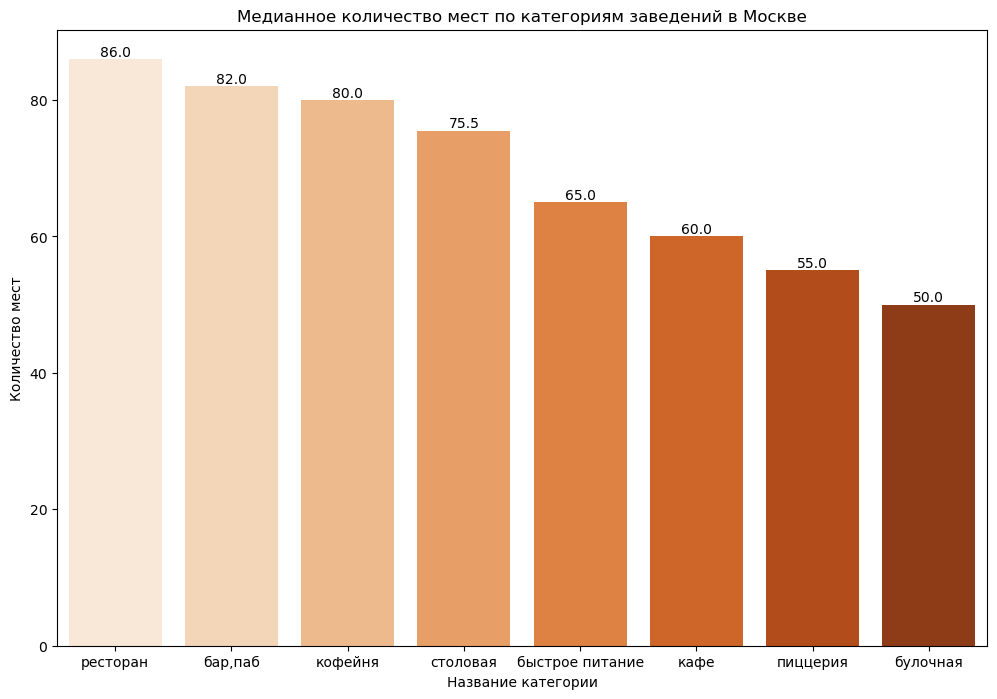

In [28]:
plt.figure(figsize=(12, 8))
sns.barplot(x='category', y='seats', data=seats_group, palette='Oranges')

# Добавляем подписи значений на столбцы
for index, value in enumerate(seats_group['seats']):
    plt.text(index, value, f'{value}', ha='center', va='bottom') 

# Настройка заголовка и меток осей
plt.title('Медианное количество мест по категориям заведений в Москве')
plt.grid(False)
plt.ylabel('Количество мест')
plt.xlabel('Название категории')

plt.show()

Если рассматривать медианное значение количества мест, то можем увидеть следующее:

* Больше всего посадочных мест у ресторанов - 86 мест;

* У баров, пабов - 82 места;

* У кофеен - 80 мест;

* У столовая - 75,5 мест; 

* У быстрого питания - 65 мест;

* У кафе - 60 мест;

* У пиццерий - 55 мест;

* Меньше всего посадочных мест у булочных - 50 мест;


### Сетевые и несетевые заведения

<a id="chain"></a>

Рассмотрим количество частных и сетевых заведений.

In [29]:
chain_group = data.groupby('chain').agg({'name': 'count'}).reset_index()

# Добавляем колонку с текстовыми подписями
chain_group['chain_label'] = chain_group['chain'].map({1: 'Сетевое заведение', 0: 'Несетевое заведение'})

# удаляем столбец chain
chain_group = chain_group[['chain_label', 'name']]

In [30]:
chain_group

,chain_label,name
0,Несетевое заведение,5199
1,Сетевое заведение,3203


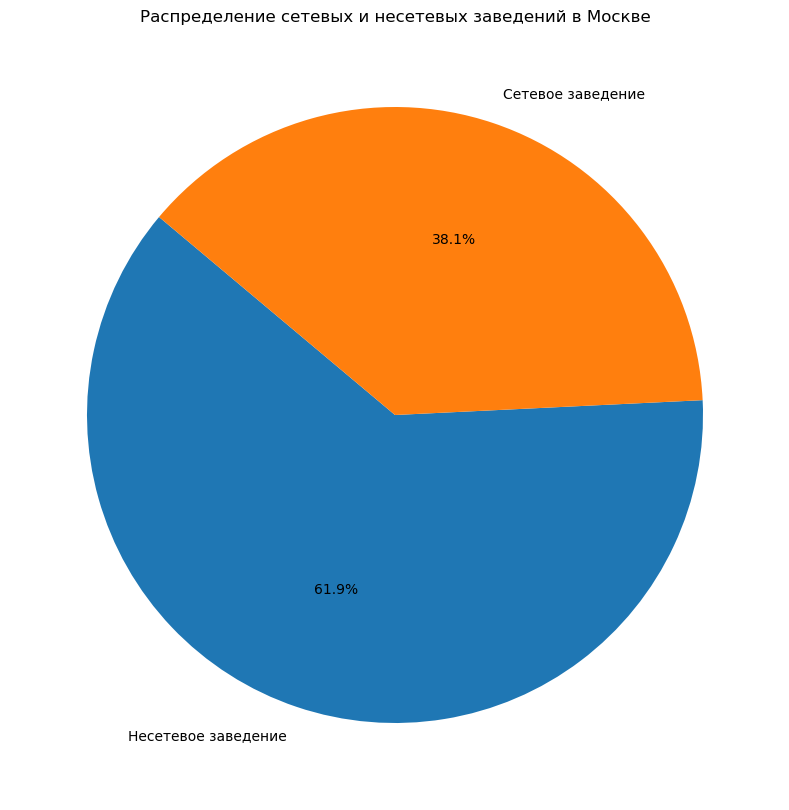

In [31]:
plt.figure(figsize=(15, 10))
plt.pie(chain_group['name'], labels=chain_group['chain_label'], autopct='%1.1f%%', startangle=140)
plt.title('Распределение сетевых и несетевых заведений в Москве')
plt.show()

Из полученных данных можем увидеть, что больше всего заведений являются несетевыми их 5 196 штук (61,9% от общего количества заведений), а сетевых заведений 3 202 штуки (38,1%).

Рассмотрим как распределяются сетевые и несетевые заведения по категориям.

In [32]:
category_chain = (data.
                  groupby(by=['category', 'chain']).
                  agg({'chain': 'count'}).
                  rename(columns={'chain': 'count_place'}).
                  reset_index())
category_chain['chain_label'] = category_chain['chain'].map({1: 'Сетевые', 0: 'Несетевые'})
category_chain = category_chain[['category', 'chain_label', 'count_place']]
category_chain

,category,chain_label,count_place
0,"бар,паб",Несетевые,596
1,"бар,паб",Сетевые,168
2,булочная,Несетевые,99
3,булочная,Сетевые,157
4,быстрое питание,Несетевые,371
5,быстрое питание,Сетевые,232
6,кафе,Несетевые,1597
7,кафе,Сетевые,779
8,кофейня,Несетевые,693
9,кофейня,Сетевые,720


In [33]:
category_fig = px.bar(category_chain.sort_values('count_place', ascending=False), 
             x='category', 
             y='count_place', 
             color='chain_label', 
             barmode='group',
             title="Распределение сетевых и несетевых заведений по категориям")

category_fig.update_layout(xaxis_title='Категория', 
                  yaxis_title='Количество заведений',
                  legend_title='Тип заведения')

category_fig.show()

Из полученного графика можем увидеть следующее:

* В категории "кафе" больше несетевых заведений (1 596), сетевых заведений 779.

* В категории "ресторан" несетевых заведений также больше (1 311), чем сетевых (729).

* В категории "кофейня" несетевых заведений немного меньше (693), чем сетевых (720).

* В категории "бар, паб" несетевых заведений 596, а сетевых 168.

* В категории "быстрое питание" несетевых заведений 371, а сетевых 232.

* В категории "пиццерия" несетевых заведений меньше (303), чем сетевых (330).

* В категории "столовая" несетевых заведений (227), а сетевых (88).

* В категории "булочная" несетевых заведений  меньше (99), чем сетевых (156).

Как мы отметили ранее, несетевых заведений больше, чем сетевых, однако, в категориях "кофейня", "пиццерия" и "булочная" мы видим, что преобладают сетевые заведения.

In [34]:
category_chain = (data
                  .groupby(by=['category', 'chain'])
                  .agg({'chain': 'count'})
                  .rename(columns={'chain': 'count_place'})
                  .reset_index())


category_chain['chain_label'] = category_chain['chain'].map({1: 'Сетевые', 0: 'Несетевые'})

# Суммирование общего количества заведений в каждой категории
total_places = category_chain.groupby('category')['count_place'].sum().reset_index()
total_places = total_places.rename(columns={'count_place': 'total_count'})

# Соединение таблиц, чтобы вычислить доли
category_chain = category_chain.merge(total_places, on='category')

# Рассчитываем долю сетевых и несетевых заведений в каждой категории
category_chain['share'] = round(category_chain['count_place'] / category_chain['total_count'], 2)


category_chain = category_chain.sort_values(by=['category', 'chain_label'])
category_chain

,category,chain,count_place,chain_label,total_count,share
0,"бар,паб",0,596,Несетевые,764,0.78
1,"бар,паб",1,168,Сетевые,764,0.22
2,булочная,0,99,Несетевые,256,0.39
3,булочная,1,157,Сетевые,256,0.61
4,быстрое питание,0,371,Несетевые,603,0.62
5,быстрое питание,1,232,Сетевые,603,0.38
6,кафе,0,1597,Несетевые,2376,0.67
7,кафе,1,779,Сетевые,2376,0.33
8,кофейня,0,693,Несетевые,1413,0.49
9,кофейня,1,720,Сетевые,1413,0.51


In [35]:
fig = px.bar(category_chain, 
             x='category', 
             y='share', 
             color='chain_label',
             title='Доля сетевых и несетевых заведений в разрезе категорий',
             labels={'share': 'Доля', 'category': 'Категория', 'chain_label': 'Тип заведения'},
            text='share')

fig.update_layout(barmode='stack')
fig.show()

Рассматривая доли сетевых и несетевых заведений видим следующее:

* В категории "бар, паб" доля сетевых заведений 22%, а несетевых 78%.

* В категории "булочная" доля сетевых заведений 61%, а несетевых 39%.

* В категории "быстрое питание" доля сетевых заведений 39%, а несетевых 61%.

* В категории "кафе" доля сетевых заведений 33%, а несетевых 67%.

* В категории "кофейня" доли примерно одинаковые, сетевых заведений 51%, а несетевых 49%.

* В категории "пиццерия" доли тоже отличаются незначительно, сетевых заведений 52%, а несетевых 48%.

* В категории "ресторан" доля сетевых заведений 36%, а несетевых 64%.

* В категории "столовая" доля сетевых заведений 28%, а несетевых 72%.



### Топ-15 популярных сетей в Москве

<a id="top-15"></a>

In [36]:
df_chain = data.query('chain == 1') # создадим отдельный датафрейм с сетевыми заведениями

In [37]:
top_chain = (df_chain.groupby(['name', 'category']).
             agg({'name': 'count'}).
             rename(columns={'name': 'count_place'}).
             sort_values('count_place', ascending=False).
             reset_index().
             head(15))

In [38]:
top_chain

,name,category,count_place
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


In [39]:
top_chain_fig = px.bar(top_chain.sort_values(by='count_place', ascending=True), 
             x='count_place', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count_place'
            )

top_chain_fig.update_layout(title='ТОП-15 сетевых заведений в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведения')

top_chain_fig.show() 

Составив топ-15 сетевых заведений в Москве, мы видим, что больше самая большая сеть - "Шоколадница" (119 заведений), затем идет "Домино'с пицца" (76 заведений) и "Додо пицца" (74 заведения), топ замыкает "Му-му" (27 заведений). Рассмотрим какие категории попали в топ. 

In [40]:
top_chain_fig = px.bar(top_chain.sort_values(by='count_place', ascending=True), 
             x='name', # указываем столбец с данными для оси X
             y='count_place', # указываем столбец с данными для оси Y
             text='count_place',
             color='category'
            )

top_chain_fig.update_layout(title='ТОП-15 сетевых заведений в Москве',
                   xaxis_title='Название заведения',
                   yaxis_title='Количество заведений')

top_chain_fig.show() 

Видим, что топ-15 в основном состоит из кофейн, так как их 6 штук, затем идут 3 кафе, 3 ресторана, 2 пиццерии и 1 булочная. 

### Административные районы Москвы и количество заведений.

<a id="district"></a>

In [41]:
district_top = (data.groupby(by='district').
                  agg({'name': 'count'}).
                  rename(columns={'name': 'count_place'}).
                  sort_values('count_place', ascending=False))

district_top

,count_place
district,
Центральный административный округ,2242
Северный административный округ,898
Южный административный округ,892
Северо-Восточный административный округ,890
Западный административный округ,850
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


Всего у нас 9 административных районов. Рассмотрим каждый район по категориям заведений.

In [42]:
district_group = (data.groupby(by=['district', 'category']).
                  agg({'name': 'count'}).
                  rename(columns={'name': 'count_place'}).
                  sort_values('count_place', ascending=False).
                  reset_index())
district_group['district'] = district_group['district'].str.replace('административный округ', 'а.о.', regex=False)
district_group

,district,category,count_place
0,Центральный а.о.,ресторан,670
1,Центральный а.о.,кафе,464
2,Центральный а.о.,кофейня,428
3,Центральный а.о.,"бар,паб",364
4,Юго-Восточный а.о.,кафе,282
...,...,...,...
67,Северо-Западный а.о.,"бар,паб",23
68,Северо-Западный а.о.,столовая,18
69,Юго-Западный а.о.,столовая,17
70,Юго-Восточный а.о.,булочная,13


In [43]:
district_group_fig = px.bar(district_group.sort_values('count_place', ascending=False), 
             x='district', 
             y='count_place', 
             color='category', 
             barmode='group',
             title="Распределение сетевых и несетевых заведений по категориям")

district_group_fig.update_layout(xaxis_title='Категория', 
                  yaxis_title='Количество заведений',
                  legend_title='Тип заведения')

district_group_fig.show()

In [44]:
fig_treemap = px.treemap(
    district_group,
    path=['district', 'category'],
    values='count_place',
    title='Распределение заведений по категориям и районам Москвы',
    labels={'count_place': 'Количество заведений', 'district': 'Район', 'category': 'Категория'}
)

fig_treemap.update_layout(
    height=800,
    width=1100)

fig_treemap.show()

Исходя из полученной информации можем сделать следующие выводы:

1) Центральный административный округ имеет наибольшее количество заведений - 2 242.

* Больше всего в данном районе ресторанов - 670, меньше всего в этом районе булочных - 50.

2) Затем идет Северный административный округ, в котором 896 заведений

* Южный автономный округ - 892 заведения

* Северо-восточный автономный округ - 889 заведений 

* Западный автономный округ - 849 заведений

* Восточный автономный округ - 798 заведений

* Юго-восточный автономный округ - 714 заведений

* Юго-западный автономный округ - 709 заведений

* Меньше всего заведений в Северо-западном автономном округе - 409 заведений.

3) Стоит отметить, что только в Центральном а.о. преобладают рестораны, в остальных а.о. больше всего кафе. Самая маленькая категория - булочные, данная тенденция наблюдается во всех округах.




### Средние рейтинги по категориям заведений.

<a id="average_rating"></a>

In [45]:
rating_group = (data.groupby('category').
                agg({'rating': 'mean'}).round(2).
                sort_values('rating', ascending=False).
               reset_index())
rating_group

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


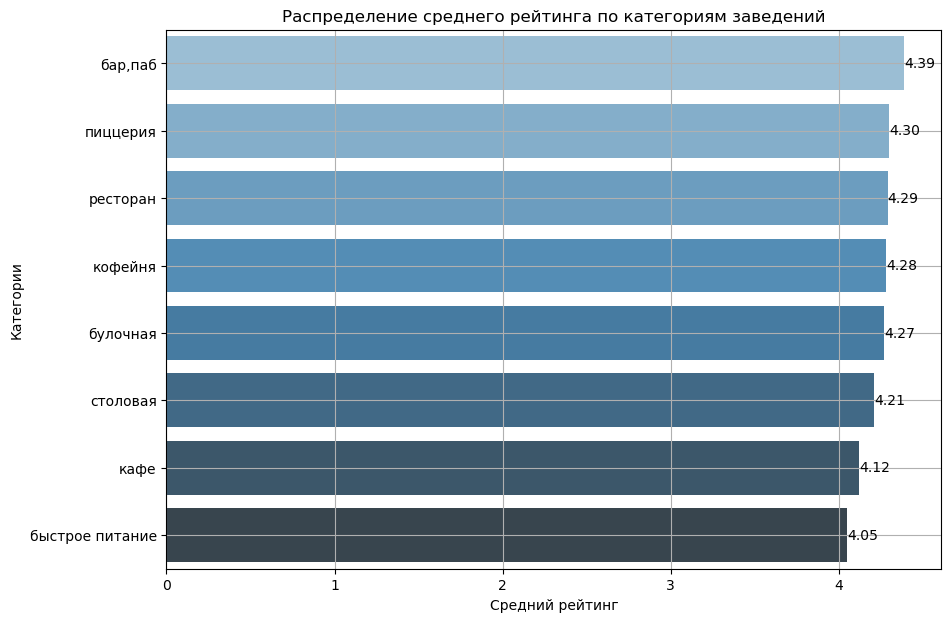

In [46]:
plt.figure(figsize=(10, 7))
sns.barplot(x='rating', y='category', data=rating_group, palette='Blues_d')

# Добавляем подписи рейтинга на столбцы
for index, value in enumerate(rating_group['rating']):
    plt.text(value, index, f'{value:.2f}', va='center')


plt.xlabel('Средний рейтинг')
plt.ylabel('Категории')
plt.title('Распределение среднего рейтинга по категориям заведений')
plt.grid(True)


plt.show()

Ситуация со средним рейтингом по категориям следующая:

* Самый высокий средний рейтинг у баров, пабов - 4.39;

* Пиццерии, рестораны, кофйни и булочные имеют примерно одинаковый средний рейтинг от 4.30 до 4.27;

* У столовых средний рейтинг 4.21;

* Категория "быстрое питание" находится на последнем месте и имеет средний рейтинг 4.05.

В целом средний рейтинг приятно удивил, так как у всех категорий он превышает 4. Далее рассмотрим как ситуация обстоит со средним рейтингом по районам.

### Фоновая катрограмма со средним рейтингом заведений каждого района.

<a id="average_rating_district"></a>

In [47]:
rating_district = (data.
                   groupby('district').
                   agg({'rating': 'mean'}).round(2).
                   sort_values('rating', ascending=False).
                   reset_index())

rating_district

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [48]:
with open("C:\\Users\\User\\OneDrive\\Desktop\\da_practicum\\CSV\\project_10\\admin_level_geomap.geojson", encoding='utf-8') as f: #загрузим json-файл
    geo_json = json.load(f)

In [82]:
# загружаем JSON-файл с границами округов Москвы
state_geo = "C:\\Users\\User\\OneDrive\\Desktop\\da_practicum\\CSV\\project_10\\admin_level_geomap.geojson"
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по административным округам',
).add_to(m)

# выводим карту
m

Картина по районам следующая:

* Самый высокий рейтинг в Центральном административном округе - 4,38. Затем идёт Северо-Западный административный округ	со средним рейтингом 4.21. В Западном и Южном административных округах средний рейтинг 4.18, в Восточном и Юго-западном 4.17. Северо-Восточный административный округ имеет средний рейтинг 4.15. Самый низкий рейтинг в Юго-Восточном административном округе 4.10.

* В целом во всех районах рейтинг превышает 4, но различия между ними минимальные.


### Все заведения датасета на карте.

<a id="map_place"></a>

In [50]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_place = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_place)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m_place

Исходя из данных, больше всего заведений общественного питания сосредоточено в центральной части Москвы. Это неудивительно, учитывая высокую плотность населения и развитую инфраструктуру в центре города, а также тот факт, что центр Москвы является основным деловым и туристическим узлом. 

Сравнивая количество заведений на севере и юге города, можно заметить, что на севере их значительно больше. Южные районы Москвы 
являются спальными районами с меньшим количеством офисов и торговых центров, что снижает спрос на кафе и рестораны. Похожая картина наблюдается и в сравнении западной и восточной части города.

### Топ-15 улиц по количеству заведений.

<a id="top-15-stree"></a>

In [51]:
street_count = (data.groupby('street').
              agg({'name': 'count'}).
              rename(columns={'name': 'count'}).
              sort_values('count', ascending=False).
             reset_index())
top_15_street = street_count.head(15)
top_15_street

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [52]:
top_15_data = data[data['street'].isin(top_15_street['street'])]

# Считаем количество заведений по категориям на каждой улице
category_counts = (top_15_data.groupby(['street', 'category'])
                   .agg({'category': 'count'})
                   .rename(columns={'category': 'count'})
                   .reset_index())
category_counts

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [53]:
sorted_streets = street_count.sort_values(by='count', ascending=False)['street'].tolist()
category_orders = {'street': sorted_streets}

# Построение графика
top_street_fig = px.bar(category_counts, 
                       x='count', 
                       y='street', 
                       color='category', 
                       title='Распределение количества заведений и их категорий по топ-15 улицам',
                       labels={'count': 'Количество заведений', 'street': 'Улица'},
                       orientation='h',
                       category_orders=category_orders)

top_street_fig.update_layout(
    xaxis_title='Количество заведений',
    yaxis_title='Улица',
    legend_title='Категория'
)

# Отображение графика
top_street_fig.show()

Рассматривая количество заведений по улицам, мы выяснили, что больше всего заведений на "проспект Мира" - 183 заведения, больше всего ресторанов (45 штук), а меньше всего столовых (2 штуки).

Меньше всего заведений на Пятницкой улице - 48 заведений. Также преобладают рестораны (18 штук), а столовых нет вообще.

### Исследование улиц с одним объектом общепита.

<a id="one-place"></a>

In [54]:
# Подсчет количества объектов на каждой улице
street_counts = data['street'].value_counts()

# Выбор улиц с одним объектом
single_object_streets = street_counts[street_counts == 1].index

# Фильтрация данных по этим улицам
single_object_data = data[data['street'].isin(single_object_streets)]

In [55]:
single_object_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


In [56]:
single_street = single_object_data['address'].value_counts().sum()
print(f'Всего таких улиц: {single_street}')

Всего таких улиц: 459


In [57]:
single_category = (single_object_data.
                groupby('category').
                agg({'name': 'count'}).
                sort_values('name', ascending=False).
                reset_index())
single_category

,category,name
0,кафе,160
1,ресторан,94
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [58]:
single_pie = go.Figure(data=[go.Pie(labels=single_category['category'], 
                                      values=single_category['name'], 
                                      pull = [0.1, 0])])
single_pie.update_layout(title='Исследование категорий с одним объектом общепита на улице')
single_pie.show() 

Всего таких улиц 459. В основном "одинокими" заведениями на улицаях являются кафе - 160 штук или 34,9% от общего количества таких заведений. Затем идут рестораны - 94 штуки или 20,5% от общего количества, а также кафе - 84 штуки или 18,3% от общего количества. Меньше всего "одиноких" заведений в категории "булочная" - 8 штук или 1.74%. Далее рассмотрим ситуацию по районам.

In [59]:
single_district = (single_object_data.
                groupby(['district']).
                agg({'name': 'count'}).
                sort_values('name', ascending=False).
                reset_index())
single_district

,district,name
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Северный административный округ,53
3,Восточный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [60]:
single_district_pie = go.Figure(data=[go.Pie(labels=single_district['district'], 
                                      values=single_district['name'], 
                                      pull = [0.1, 0])])
single_district_pie.update_layout(title='Исследование районов с одним объектом общепита на улице')
single_district_pie.show() 

В ситуцации с районами картина следующая:

* Основное количество "одиноких" заведений находится в Центральном административном округе - 145 штук или 31,6% от общего количества заведений. Меньше всего таких заведений в Юго-Западном административном округе - всего 18 штук или 3,92%.  

### Средние чеки

<a id="average_bill"></a>

In [61]:
average_bill_district = data.groupby('district')['middle_avg_bill'].median().reset_index()
average_bill_district.sort_values('middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [62]:
average_bill_m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=average_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Медианный чек по административным округам',
).add_to(average_bill_m)

# выводим карту
average_bill_m

Самый высокий средний чек наблюдается сразу в двух районах Москвы: Центральный административный округ и Западный административный округ, в этих районах в среднем люди платят в заведениях 1 000 рублей. Самый низкий чек в Юго-Восточном административном округе - 450 рублей.	

### Дополнительное исследование

<a id="dop_da"></a>

Рассмотрим круглосуточные заведения и их зависимость от расположения и категории.

In [63]:
place_24_7 = data.query('is_24_7 == True')

In [64]:
district_24_7 = (place_24_7.
                 groupby('district').
                 agg({'name': 'count'}).
                 sort_values('name', ascending=False).
                reset_index())
district_24_7

,district,name
0,Центральный административный округ,131
1,Восточный административный округ,97
2,Юго-Восточный административный округ,93
3,Северо-Восточный административный округ,75
4,Южный административный округ,75
5,Юго-Западный административный округ,73
6,Западный административный округ,72
7,Северный административный округ,71
8,Северо-Западный административный округ,43


In [65]:
district_24_fig = px.bar(district_24_7.sort_values(by='name', ascending=True), 
             x='name', 
             y='district', 
             text='name'
            )

district_24_fig.update_layout(title='Распределение круглосуточных заведений по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района')

district_24_fig.show() 

Больше всего круглосуточных заведений в Центральном административном округе - 131 заведение. Затем идут Восточный а.о. с 97 заведениями и Юго-Восточный а.о. с 93 заведениями. В остальных районах заведений, которые работают круглосуточно, примерно одинаково - от 71 до 75, кроме Северо-Западного а.о., в котором всего 43 круглосуточных заведений.

In [66]:
category_24_7 = (place_24_7.
                 groupby('category').
                 agg({'name': 'count'}).
                 sort_values('name', ascending=False).
                reset_index())
category_24_7

,category,name
0,кафе,267
1,быстрое питание,150
2,ресторан,135
3,кофейня,59
4,"бар,паб",52
5,пиццерия,31
6,булочная,24
7,столовая,12


In [67]:
category_24_fig = px.bar(category_24_7.sort_values(by='name', ascending=True), 
             x='name', 
             y='category', 
             text='name'
            )

category_24_fig.update_layout(title='Распределение круглосуточных заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Навзание категории')

category_24_fig.show() 

В случае с категориями картина с круглосуточными заведениями следующая:

* Больше всего таких заведений в категории кафе - 267 штук.

* Затем идет быстрое питание, которых набралось 150 штук, и рестораны в размере 135 заведений.

* В остальных категориях круглосуточных заведений значительно меньше, от 12 до 59. 

**Промежуточный вывод по шагу 3**:

В ходе анализа данных мы выяснили следующее:

1) Категории заведений.

* В москве 8 402 заведения, которые разбиваются на 9 категорий - "кафе", "ресторан", "бар, паб", "пиццерия", "быстрое питание", "столовая", "булочная".
    
    * Больше всего заведений в категории "кафе" - 2 375 штук (28,3% от всего количества заведений);

    * Меньше всего заведений в категории "булочная" 255 штук (3,04% от всего количества заведений);
    
2) Посадочные места.

* В основном в нашем датасете представлены заведения, у которых среднее количество посадочных мест от 50 до 86. 

    * Больше всего посадочных мест у ресторанов - 86 мест;

    * Меньше всего посадочных мест у булочных - 50 мест;
    
3) Сетевые и несетевые заведения.

* Исходя из круговой диаграммы мы увидели, что больше всего заведений являются несетевыми их 5 196 штук (61,9% от общего количества заведений), а сетевых заведений 3 202 штуки (38,1%).

* По категориям картина следующая:

    * В категории "кафе" больше несетевых заведений (1 596), сетевых заведений 779.

    * В категории "булочная" несетевых заведений меньше (99), чем сетевых (156).

* Во всех категориях преобладают несетевые заведения, однако, у "кофейня", "пиццерия" и "булочная" наоборот сетевых заведений больше.

4) Топ-15 популярных сетей в Москве.

* Составив топ-15 сетевых заведений в Москве, мы увидели, что самая большая сеть - "Шоколадница" (120 заведений), затем идет "Домино'с пицца" (76 заведений) и "Додо пицца" (74 заведения), топ замыкает "Му-му" (27 заведений). Топ-15 в основном состоит из кофейн, так как их 6 штук, затем идут 3 кафе, 3 ресторана, 2 пиццерии и 1 булочная.

5) Административные районы Москвы.

* Всего у нас 9 административных районов.

    * Центральный административный округ имеет наибольшее количество заведений - 2 242. Больше всего в данном районе ресторанов - 670, меньше всего в этом районе булочных - 50.

    * Меньше всего заведений в Северо-западном автономном округе - 409 заведений.

* Только в Центральном а.о. преобладают рестораны, в остальных а.о. больше всего кафе. Самая маленькая категория - булочные, данная тенденция наблюдается во всех округах.

6) Средний рейтинг по категориям.

* Ситуация со средним рейтингом по категориям следующая:

    * Самый высокий средний рейтинг у баров, пабов - 4.39;

    * Пиццерии, рестораны, кофйни и булочные имеют примерно одинаковый средний рейтинг от 4.30 до 4.27;

    * У столовых средний рейтинг 4.21;

    * Категория "быстрое питание" находится на последнем месте и имеет средний рейтинг 4.05.

* В целом средний рейтинг приятно удивил, так как у всех категорий он превышает 4.

7) Средний рейтинг по районам.

* Самый высокий рейтинг в Центральном административном округе - 4,38. Затем идёт Северо-Западный административный округ со средним рейтингом 4.21. В Западном и Южном административных округах средний рейтинг 4.18, в Восточном и Юго-западном 4.17. Северо-Восточный административный округ имеет средний рейтинг 4.15. Самый низкий рейтинг в Юго-Восточном административном округе 4.10.

* В целом во всех районах рейтинг превышает 4, но различия между ними минимальные.

8) Заведения на карте.

* Исходя из данных, больше всего заведений общественного питания сосредоточено в центральной части Москвы. Это неудивительно, учитывая высокую плотность населения и развитую инфраструктуру в центре города, а также тот факт, что центр Москвы является основным деловым и туристическим узлом. 

* Сравнивая количество заведений на севере и юге города, можно заметить, что на севере их значительно больше. Южные районы Москвы являются спальными районами с меньшим количеством офисов и торговых центров, что снижает спрос на кафе и рестораны. Похожая картина наблюдается и в сравнении западной и восточной части города.

9) Топ-15 улиц по количеству заведений.

* Рассматривая количество заведений по улицам, мы выяснили, что больше всего заведений на "проспект Мира" - 183 заведения, больше всего ресторанов (45 штук), а меньше всего столовых (2 штуки).

* Меньше всего заведений на Пятницкой улице - 48 заведений. Также преобладают рестораны (18 штук), а столовых нет вообще.

10) Исследование улиц с одним объектом

* Всего таких улиц 459. В основном "одинокими" заведениями на улицаях являются кафе - 160 штук или 34,9% от общего количества таких заведений. Затем идут рестораны - 94 штуки или 20,5% от общего количества, а также кафе - 84 штуки или 18,3% от общего количества. Меньше всего "одиноких" заведений в категории "булочная" - 8 штук или 1.74%. 

* Основное количество "одиноких" заведений находится в Центральном административном округе - 145 штук или 31,6% от общего количества заведений. Меньше всего таких заведений в Юго-Западном административном округе - всего 18 штук или 3,92%.

11) Средние чеки.

* Самый высокий средний чек наблюдается сразу в двух районах Москвы: Центральный административный округ и Западный административный округ, в этих районах в среднем люди платят в заведениях 1 000 рублей, что не удивительно, так как это в этих районах находится туристический узел и самая дорогая недвижимость. Самый низкий чек в Юго-Восточном административном округе - 450 рублей.

12) Круглосуточные заведения.

* Больше всего круглосуточных заведений в Центральном административном округе - 131 заведение. Затем идут Восточный а.о. с 97 заведениями и Юго-Восточный а.о. с 93 заведениями. В остальных районах заведений, которые работают круглосуточно, примерно одинаково - от 71 до 75, кроме Северо-Западного а.о., в котором всего 43 круглосуточных заведений.

* Если рассматривать категории, то больше всего круглосуточных заведений в категории кафе - 267 штук. Затем идет быстрое питание, которых набралось 150 штук, и рестораны в размере 135 заведений. В остальных категориях круглосуточных заведений значительно меньше, от 12 до 59.

## Детализируем исследование: открытие кофейни.

<a id="open-cofee"></a>

### Кофейные районы

<a id="cofee-district"></a>

In [68]:
data_cofee = data.query('category == "кофейня"')

In [69]:
print(f'Всего кофеен в датасете: {data_cofee.shape[0]}')

Всего кофеен в датасете: 1413


In [70]:
cofee_destrict = data_cofee.groupby('district').agg({'name': 'count'}).reset_index()
cofee_destrict

,district,name
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [71]:
cofee_district_pie = go.Figure(data=[go.Pie(labels=cofee_destrict['district'], 
                                      values=cofee_destrict['name'])])
cofee_district_pie.update_layout(title='Распределение кофеен по районам')
cofee_district_pie.show() 

Всего у нас 1413 заведений в категории "кофейня". Больше всего кофеен в Центральном административном округе - 428 штук или 30,3% от общего количества кофейн. Затем идет Северный а.о., в данном районе 193 кофейни или 13,7% от общего количества, в Северо-Восточном округе 159 кофеен или 11,3% от общего количества.. Меньше всего кофеен в Северо-Западном а.о. - всего 62 кофейни или 4,39 от общего количества. 

### Круглосуточные кофейни

<a id="cofee-24"></a>

In [72]:
cofee_24_7 = (data_cofee.
              query('is_24_7 == True').
              groupby('district').
              agg({'name': 'count'}).
              reset_index())
cofee_24_7

,district,name
0,Восточный административный округ,5
1,Западный административный округ,9
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
5,Центральный административный округ,26
6,Юго-Восточный административный округ,1
7,Юго-Западный административный округ,7
8,Южный административный округ,1


In [73]:
all_24_cofee = cofee_24_7['name'].sum()
print(f'Всего круглосуточных кофеен: {all_24_cofee}')

Всего круглосуточных кофеен: 59


In [74]:
cofee_24_pie = go.Figure(data=[go.Pie(labels=cofee_24_7['district'], 
                                      values=cofee_24_7['name'])])
cofee_24_pie.update_layout(title='Распределение круглосуточных кофеен по районам')
cofee_24_pie.show() 

Всего в нашем датасете 59 круглосуточных кофеен. Большинство из них находится в Центральном административном округе - 26 штук или 44,1%. Также больше 10% круглосуточных кофеен находятся в Западном и в Юго-Западном районах. Меньше всего круглосуточных кофеен в Юго-Восточном и Южном а.о. - всего по одной кофейне.

In [75]:
hours_cofee = data_cofee.groupby(['district', 'is_24_7']).agg({'name': 'count'}).reset_index()
hours_cofee

,district,is_24_7,name
0,Восточный административный округ,False,97
1,Восточный административный округ,True,5
2,Западный административный округ,False,139
3,Западный административный округ,True,9
4,Северный административный округ,False,186
5,Северный административный округ,True,5
6,Северо-Восточный административный округ,False,154
7,Северо-Восточный административный округ,True,3
8,Северо-Западный административный округ,False,60
9,Северо-Западный административный округ,True,2


In [76]:
cofee_fig = px.bar(hours_cofee.sort_values('name', ascending=False), 
             x='district', 
             y='name', 
             color='is_24_7',
             title="Соотношение круглосуточных и некруглосуточных кофеен по районам")

cofee_fig.update_layout(xaxis_title='Круглосуточный режим работы', 
                  yaxis_title='Количество кофеен',
                  legend_title='Название района',
                  height=900,
                  width=1000)

cofee_fig.show()

Из этого графика мы видим, что в Москве в основном представлены некруглосуточные кофейни, а круглосуточных по сравнению с ними ничтожно мало, стоит взять на вооружение этот факт и задуматься об открытии круглосуточного заведения.

### Рейтинги кофеен

<a id="cofee-rating"></a>

In [77]:
rating_cofee = (data_cofee.
                groupby('district', as_index=False)['rating'].mean().round(2).
               sort_values('rating', ascending=False))
rating_cofee

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [78]:
rating_cofee_m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cofee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по админитративным округам',
).add_to(rating_cofee_m)

# выводим карту
rating_cofee_m

Самый высокий средний рейтинг у кофеен в Центральном административном округе - 4,34. Затем идет Северо-Западный административный округ - 4.33. Северный, Восточный и Юго-Западный административные округа имеют примерно одинаковый рейтинг 4,29 и 4,28 соответственно. С Юго-Восточным, Южным и Северо-Восточным административными округами ситуация такая же, рейтинг у них 4.23 и 4.22. Самый низкий средний рейтинг в Западном административном округе - 4.20. Рейтинги кофеен в основном больше 4.20, но различия между районами не столь сильны.

### Средняя цена чашки капучино

<a id="average-cofee"></a>

In [79]:
middle_cofee_price = data['middle_coffee_cup'].mean()
print(f'Средняя цена чашки капучино по Москве составляет: {middle_cofee_price.round(2)}')

Средняя цена чашки капучино по Москве составляет: 174.72


Далее расмотрим среднюю цену по районам.

In [80]:
middle_cofee = (data_cofee.
                groupby('district', as_index=False)['middle_coffee_cup'].
                mean().round(2).
                sort_values('middle_coffee_cup', ascending=False))
middle_cofee

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [81]:
average_cofee_m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_cofee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек чашки капучино по административным округам Москвы',
).add_to(average_cofee_m)

# выводим карту
average_cofee_m

В среднем по Москве чашка капучино стоит 174,72. Рассматривая среднюю цену по районам можем выделить Западный, Центральный, Юго-Западный административные округа, так как в этих районах самая высокая цена, от 184 до 189 рублей. Самая низкая цена в Юго-Восточном административном округе - 151 рубль. 

 Если вы планируете открытие кофенйи в одном из центральных или престижных районов (Западный, Центральный, Юго-Западный административные округа), то разумно ориентироваться на цену в пределах 184-189 рублей за чашку. Это позволит соответствовать уровню цен и ожиданиям клиентов в этих районах.

В то же время, если ваше заведение будет находиться в более бюджетных районах, таких как Юго-Восточный административный округ, возможно, стоит установить цену ближе к нижней границе – около 150-160 рублей. Это поможет привлечь клиентов, которые ожидают более доступные цены.

**Промежуточный вывод по шагу 4:**

1) Кофейные районы.

Всего у нас 1413 заведений в категории "кофейня". Больше всего кофеен в Центральном административном округе - 428 штук или 30,3% от общего количества кофейн. Затем идет Северный а.о., в данном районе 193 кофейни или 13,7% от общего количества, в Северо-Восточном округе 159 кофеен или 11,3% от общего количества. Меньше всего кофеен в Северо-Западном а.о. - всего 62 кофейни или 4,39 от общего количества.

2) Круглосуточные кофейни.

Всего в нашем датасете 59 круглосуточных кофеен. Большинство из них находится в Центарльном административном округе - 26 штук или 44,1%. Также больше 10% круглосуточных кофеен находятся в Западном и в Юго-Западном районах. Меньше всего круглосуточных кофеен в Юго-Восточном и Южном а.о. - всего по по одной кофейне.

Из графика мы увидели, что в Москве в основном представлены некруглосуточные кофейни, а круглосуточных по сравнению с ними ничтожно мало, стоит взять на вооружение этот факт и задуматься об открытии круглосуточного заведения.

3) Рейтинги кофеен.

Самый высокий средний рейтинг у кофеен в Центральном административном округе - 4,34. Затем идет Северо-Западный административный округ - 4.33. Северный, Восточный и Юго-Западный административные округа имет примерно одинаковый рейтинг 4,29 и 4,28 соответственно. С Юго-Восточным, Южным и Северо-Восточным административными округами ситуация такая же, рейтинг у них 4.23 и 4.22. Самый низкий средний рейтинг в Западном административном округе - 4.20. Рейтинги кофеен в основном больше 4.20, но различия между районами не столь сильны.

4) Цена чашки капучина.

В среднем по Москве чашка капучино стоит 174,72. Рассматривая среднюю цену по районам можем выделить Западный, Центральный, Юго-Западный административные округа, так как в этих районах самая высокая цена, от 184 до 189 рублей. Самая низкая цена в Юго-Восточном административном округе - 151 рубль.

Если вы планируете открытие кофенйи в одном из центральных или престижных районов (Западный, Центральный, Юго-Западный административные округа), то разумно ориентироваться на цену в пределах 184-189 рублей за чашку. Это позволит соответствовать уровню цен и ожиданиям клиентов в этих районах.

В то же время, если ваше заведение будет находиться в более бюджетных районах, таких как Юго-Восточный административный округ, возможно, стоит установить цену ближе к нижней границе – около 150-160 рублей. Это поможет привлечь клиентов, которые ожидают более доступные цены.

# Итоговый вывод

<a id="conclusion"></a>

В предоставленном нам датасете 8 406 строк, столбцы имеют корректный тип данных, нет явных дубликатов, но присутствуют невные дубликаты. В названиях округов и категориях их нет, однако, есть заведения (4 штуки),у которых совпадает название, адрес и округ. В данном случае было принято решение удалить дубликаты.

Также присутствуют пропуски в 6 столбцах. 

* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт». Мы увидели, что в столбце корректное количество пропусков, так как в avg_bill 3149 строк содержат "Средний счёт". middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена чашки капучино». В столбце avg_bill 535 строк содержат информацию о цене одной чашки капучину, поэтому ропуски в столбце middle_coffee_cup можно считать корректными.

* Природа пропусков в отсальных столбцах не понятна, так как ранее указывалось, что информация в датафрейме могла быть получена с помощью пользователей или взята из общедоступных источников, то в этом случае некоторые данные о заведениях могли быть просто пропущены или о них нет информации. Заполнять пропуски вручную считаю не првильным решением, так в некоторых столбцах их более 4 000.

В ходе анализа данных мы выяснили следующее:

* Категории заведений: В Москве больше всего заведений представлено в категории "кафе" (28,3%), а наименьшее количество — в категории "булочная" (3,04%). Это указывает на то, что формат кафе является наиболее популярным среди москвичей и гостей города.

* Посадочные места: Рестораны имеют наибольшее количество посадочных мест, что логично, учитывая их ориентированность на длительные трапезы и разнообразное меню. Булочные, напротив, предлагают меньше всего мест, что соответствует их функции — продажа выпечки и короткие визиты.

* Несетевые и сетевые заведения: Хотя в Москве больше несетевых заведений (61,9%), некоторые категории, такие как кофейни, пиццерии и булочные, более склонны к сетевому формату, возможно, из-за стандартизации продуктов и услуг.

* Топ-15 популярных сетей: В топ-15 самых популярных сетей преобладают кофейни. Это свидетельствует о высокой востребованности таких заведений в Москве, особенно среди молодого и делового населения, которое часто пользуется кофейнями для встреч и работы.

* Исследование районов: Центральный административный округ является главным центром сосредоточения заведений общественного питания (2 242 заведения). Этот факт подчеркивает экономическую и туристическую значимость центра Москвы.

* Средние рейтинги заведений: Все категории заведений имеют средний рейтинг выше 4, что говорит о высоком качестве обслуживания и удовлетворенности клиентов. Особенно выделяются бары и пабы с наивысшим рейтингом 4.39.

* Распределение заведений по районам: Центр Москвы, ожидаемо, обладает наибольшей плотностью заведений. Северные районы также имеют больше заведений по сравнению с южными, что, вероятно, связано с деловой активностью и плотностью населения.


* Исследование улиц с одним объектом: Всего таких улиц 459. В основном "одинокими" заведениями на улицаях являются кафе - 160 штук, затем идут рестораны - 94 штуки, а также кафе - 84 штуки. Меньше всего "одиноких" заведений в категории "булочная" - 8 штук или 1.74%. Основное количество "одиноких" заведений находится в Центральном административном округе - 145 штук или 31,6% от общего количества заведений. Меньше всего таких заведений в Юго-Западном административном округе - всего 18 штук или 3,92%.

* Средние чеки: Самый высокий средний чек наблюдается сразу в двух районах Москвы: Центральный административный округ и Западный административный округ, в этих районах в среднем люди платят в заведениях 1 000 рублей, что не удивительно, так как это в этих районах находится туристический узел и самая дорогая недвижимость. Самый низкий чек в Юго-Восточном административном округе - 450 рублей.

* Круглосуточные заведения: Больше всего круглосуточных заведений в Центральном административном округе - 131 заведение. Затем идут Восточный а.о. с 97 заведениями и Юго-Восточный а.о. с 93 заведениями. В остальных районах заведений, которые работают круглосуточно, примерно одинаково - от 71 до 75, кроме Северо-Западного а.о., в котором всего 43 круглосуточных заведений. Если рассматривать категории, то больше всего круглосуточных заведений в категории кафе - 267 штук. Затем идет быстрое питание, которых набралось 150 штук, и рестораны в размере 135 заведений. В остальных категориях круглосуточных заведений значительно меньше, от 12 до 59.

Детализируемое исследование для открытия кафе дало следующую картину: 

1) Кофейные районы.

* Всего у нас 1413 заведений в категории "кофейня". Больше всего кофеен в Центральном административном округе - 428 штук или 30,3% от общего количества кофейн. Затем идет Северный а.о., в данном районе 193 кофейни или 13,7% от общего количества, в Северо-Восточном округе 159 кофеен или 11,3% от общего количества. Меньше всего кофеен в Северо-Западном а.о. - всего 62 кофейни или 4,39 от общего количества.

2) Круглосуточные кофейни.

* Из общего числа кофеен лишь 59 заведений работают круглосуточно, что составляет незначительную долю. Более 44% круглосуточных кофеен находится в ЦАО, что отражает высокий спрос на такие заведения в центре города, где активность не спадает даже ночью. В других районах, таких как Западный и Юго-Западный округа, круглосуточных кофеен также немного, но они присутствуют. В Юго-Восточном и Южном округах всего по одной круглосуточной кофейне, что указывает на возможный пробел в услугах для этих районов.

3) Рейтинги кофеен.

* Самый высокий средний рейтинг у кофеен в Центральном административном округе - 4,34. Затем идет Северо-Западный административный округ - 4.33. Северный, Восточный и Юго-Западный административные округа имет примерно одинаковый рейтинг 4,29 и 4,28 соответственно. С Юго-Восточным, Южным и Северо-Восточным административными округами ситуация такая же, рейтинг у них 4.23 и 4.22. Самый низкий средний рейтинг в Западном административном округе - 4.20. Рейтинги кофеен в основном больше 4.20, но различия между районами не столь сильны.

4) Цена чашки капучина.

* В среднем по Москве чашка капучино стоит 174,72. Рассматривая среднюю цену по районам можем выделить Западный, Центральный, Юго-Западный административные округа, так как в этих районах самая высокая цена, от 184 до 189 рублей. Самая низкая цена в Юго-Восточном административном округе - 151 рубль.

* Если вы планируете открытие кофенйи в одном из центральных или престижных районов (Западный, Центральный, Юго-Западный административные округа), то разумно ориентироваться на цену в пределах 184-189 рублей за чашку. Это позволит соответствовать уровню цен и ожиданиям клиентов в этих районах.

* В то же время, если ваше заведение будет находиться в более бюджетных районах, таких как Юго-Восточный административный округ, возможно, стоит установить цену ближе к нижней границе – около 150-160 рублей. Это поможет привлечь клиентов, которые ожидают более доступные цены.

Рекомендации для открытия нового заведения:

1) Выбор района:

* Центральный административный округ: Несмотря на высокую конкуренцию, Центральный а.о. остается привлекательным местом для открытия кофейни. Высокие рейтинги заведений и готовность клиентов платить больше делают этот район перспективным для премиального кафе с качественным обслуживанием и уникальной атмосферой.

* Юго-Восточный и Южный округа: С учетом низкого количества кофеен и редкости круглосуточных заведений, эти районы могут быть отличным выбором для открытия нового заведения с акцентом на доступные цены.

2) Ценовая политика:

* В Центральном округе и других престижных районах разумно установить цену на капучино в пределах 184-189 рублей. Это соответствует ожиданиям клиентов и конкурентной среде.

* В менее престижных районах, таких как Юго-Восточный округ, стоит рассмотреть более доступные цены, 150-160 рублей, что может привлечь более широкий круг клиентов.

3) Формат заведения:

* Круглосуточная кофейня: С учетом недостатка круглосуточных кофеен, особенно в Южном и Юго-Восточном округах, открытие заведения с круглосуточным режимом работы может стать конкурентным преимуществом.

* Уникальная концепция и атмосфера: В условиях высокой конкуренции, особенно в Центральном административном округе, важно предложить что-то уникальное, будь то интерьер, концепция или меню. Так как основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья» и их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве, то смело можно пробовать открыть заведение в престижных районах.

# Презентация

<a id="presentation"></a>

[Презентация по проекту](https://disk.yandex.ru/i/WzEmptefNZglgw)